**Implementation for Task 1 using sirs broilerplate code as a template**

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
import tensorflow as tf  
import pandas as pd
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasClassifier
import seaborn as sns
from sklearn.utils.multiclass import unique_labels
import sklearn

In [2]:
import os

# Load and preprocess the data
data = []  # List to store image data
labels = []  # List to store labels

# Define a function to extract the person label from the file name
def extract_person_label(file_name):
    return int(file_name.split('.')[0].replace('subject', '')) - 1  # Subtract 1 to make labels start from 0

# Load data and labels
# Assuming the dataset files are in the 'dataset' directory
dataset_dir = 'D:/FAST_NUCES/7thSemester/DLP/Assignment/Assignment1/Dataset/yale'

for file_name in os.listdir(dataset_dir):
    img = plt.imread(os.path.join(dataset_dir, file_name))
    # print(img.shape)
    data.append(img.flatten())  # Flatten image into a 1D array
    labels.append(extract_person_label(file_name))

data = np.array(data)
labels = np.array(labels)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=42)


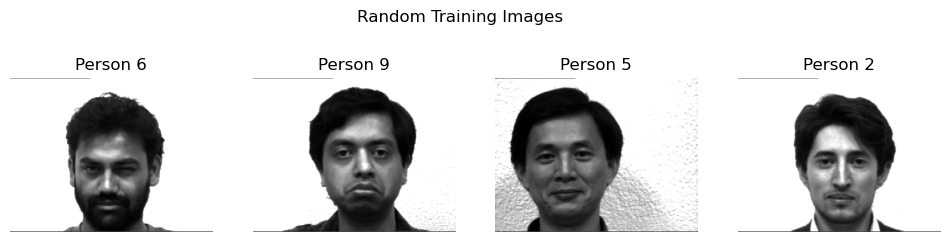

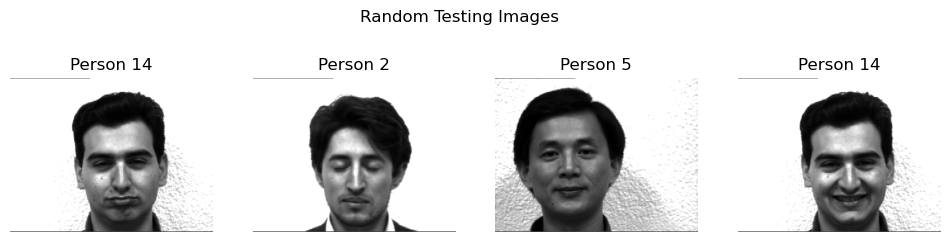

In [3]:
import random

# Randomly select four indices from the training dataset
train_indices = random.sample(range(len(X_train)), 4)

# Randomly select four indices from the testing dataset
test_indices = random.sample(range(len(X_test)), 4)

# Function to display images
def display_images(images, labels, title):
    plt.figure(figsize=(12, 3))
    plt.suptitle(title)
    for i, (image, label) in enumerate(zip(images, labels), 1):
        plt.subplot(1, 4, i)
        plt.imshow(image.reshape((243, 320)), cmap='gray')
        plt.title(f"Person {label}")
        plt.axis('off')
    plt.show()

# Display four random training images
train_images_to_display = X_train[train_indices]
train_labels_to_display = y_train[train_indices]
display_images(train_images_to_display, train_labels_to_display, "Random Training Images")

# Display four random testing images
test_images_to_display = X_test[test_indices]
test_labels_to_display = y_test[test_indices]
display_images(test_images_to_display, test_labels_to_display, "Random Testing Images")

**My Own Code Follows This Point Onwards**

In [4]:
# Import Keras modules
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import SGD

# Define a function that creates a Keras model
def create_model(neurons_per_layer=10, hidden_layers=1, activation_function='relu', learning_rate=0.01, momentum=0.9):
    # Create a Sequential model
    model = tf.keras.Sequential()
    # Add an input layer with the same shape as the input data

    model.add(tf.keras.layers.Input(shape=(X_train.shape[1],)))
    # Add hidden layers with the given number of neurons and activation function
    for i in range(hidden_layers):
        model.add(tf.keras.layers.Dense(neurons_per_layer, activation=activation_function))
    # Add an output layer with 15 neuron and sigmoid activation for multiclass classification
    model.add(tf.keras.layers.Dense(15, activation='softmax'))
    # Create an optimizer with the given learning rate and momentum
    #optimizer = SGD(learning_rate=learning_rate, momentum=momentum)
    #that parts an SGD req only
    # Compile the model with sparse categorical crossentropy loss and accuracy metric
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    # Return the model
    return model


In [5]:
#Defined a call back function to stop training when accuracy reaches 98%
class myCallback(tf.keras.callbacks.Callback):
        # Define the correct function signature for on_epoch_end
        def on_epoch_end(self, epoch, logs={}):
            if logs.get('accuracy') is not None and logs.get('accuracy') > 0.98:                 
                print("\nReached 98% accuracy so cancelling training!")
                
                # Stop training once the above condition is met
                self.model.stop_training = True
# Instantiate class
callback = myCallback()

In [6]:
# Function to train and evaluate the MLP model
def train_evaluate_mlp(neurons_per_layer=20,hidden_layers=3, activation_function='relu', learning_rate=0.01, momentum=0.09, epochs=20, batch_size=32):
    model = create_model(neurons_per_layer, hidden_layers, activation_function, learning_rate, momentum)
    
    
    # Train the model
    history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2,callbacks=[callback])
    
    # Test the model and calculate evaluation metrics
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)
    
    accuracy = accuracy_score(y_test, y_pred_classes)
    precision = precision_score(y_test, y_pred_classes, average='macro')
    recall = recall_score(y_test, y_pred_classes, average='macro')
    f1 = f1_score(y_test, y_pred_classes, average='macro')
    
    print(f'Accuracy: {accuracy:.2f}')
    print(f'Precision: {precision:.2f}')
    print(f'Recall: {recall:.2f}')
    print(f'F1-score: {f1:.2f}')

    return accuracy, precision, recall, f1, history, y_pred_classes


In [7]:
# Experiment 2: With hyperparameter tuning (GridSearchCV)
param_grid = {
    'neurons_per_layer': [32, 64, 128],
    'hidden_layers': [1, 2, 3],
    'activation_function': ['relu', 'sigmoid'],
    'learning_rate': [0.1, 0.01, 0.001],
    'momentum': [0.9, 0.8, 0.7],
    'epochs': [20, 50, 100]
}

# Create an instance of your MLP model
#mlp_model = create_mlp_model(hidden_layers=2, neurons_per_layer=64, activation_function='relu')
#Note to future self- making this instance does not force GridSearchCV to use these settings. It is just a template for the architecture you're using.
#instead it will use the param_grid to find the best settings.
#That didn't work but the logic behind my statements remains the same.

mlp_classifier = KerasClassifier(build_fn=create_model, epochs=100, batch_size=100) 


# Initialize GridSearchCV with the MLP model as the estimator
grid_search = GridSearchCV(estimator=mlp_classifier,
                           param_grid=param_grid,
                           scoring='accuracy',
                           cv=3,
                           refit=True)

# Fit the GridSearchCV object
grid_search.fit(X_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_

#queue to find out my code has stopped running
import winsound
winsound.Beep(440, 1000)

# Print the best parameters
print(f'Best parameters: {best_params}')

C:\Users\rahei\AppData\Local\Temp\ipykernel_16172\2766964961.py:17: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  mlp_classifier = KerasClassifier(build_fn=create_model, epochs=100, batch_size=100)


Epoch 1/20
1/1 [==============================] - 0s 250ms/step - loss: 512.6808 - accuracy: 0.0227
Epoch 2/20
1/1 [==============================] - 0s 15ms/step - loss: 11173.8369 - accuracy: 0.0568
Epoch 3/20
1/1 [==============================] - 0s 16ms/step - loss: 15665.6504 - accuracy: 0.0682
Epoch 4/20
1/1 [==============================] - 0s 16ms/step - loss: 13954.1963 - accuracy: 0.0795
Epoch 5/20
1/1 [==============================] - 0s 14ms/step - loss: 10871.4199 - accuracy: 0.1250
Epoch 6/20
1/1 [==============================] - 0s 13ms/step - loss: 9092.9424 - accuracy: 0.0909
Epoch 7/20
1/1 [==============================] - 0s 15ms/step - loss: 6769.1948 - accuracy: 0.0795
Epoch 8/20
1/1 [==============================] - 0s 13ms/step - loss: 3789.2617 - accuracy: 0.0909
Epoch 9/20
1/1 [==============================] - 0s 17ms/step - loss: 900.5112 - accuracy: 0.1591
Epoch 10/20
1/1 [==============================] - 0s 19ms/step - loss: 322.4427 - accuracy: 0.15

In [10]:
best_params

{'activation_function': 'relu',
 'epochs': 100,
 'hidden_layers': 2,
 'learning_rate': 0.001,
 'momentum': 0.8,
 'neurons_per_layer': 128}

In [47]:
#note check the split of your train test next time before proceeding. If your test already has column 3 in it 
#then skip this box worth of code.

#fixed version; explaination available for this before confusion matrix
#finding indices of samples that belong to class 3 in the train set
train_indices_3 = np.where (y_train == 3) [0]

#selecting 4 random samples from the train set
n_samples = 4
selected_indices = np.random.choice (train_indices_3, size=n_samples, replace=False)

#adding the selected samples to the test set
X_test = np.concatenate ((X_test, X_train [selected_indices]), axis=0)
y_test = np.concatenate ((y_test, y_train [selected_indices]), axis=0)

In [55]:
#running test for the model with the best parameters
accuracy2, precision2, recall2, f1_2, history2, y_pred2 = train_evaluate_mlp(**best_params, batch_size=100)

#please note that the performance has dropped due to the addition of the 4 samples from class 3 to the test set.

Epoch 1/100
2/2 [==============================] - 0s 130ms/step - loss: 940.0175 - accuracy: 0.0571 - val_loss: 21655.1328 - val_accuracy: 0.0000e+00
Epoch 2/100
2/2 [==============================] - 0s 43ms/step - loss: 17548.4902 - accuracy: 0.0667 - val_loss: 11660.9980 - val_accuracy: 0.0741
Epoch 3/100
2/2 [==============================] - 0s 49ms/step - loss: 9746.0449 - accuracy: 0.0952 - val_loss: 11201.6768 - val_accuracy: 0.1111
Epoch 4/100
2/2 [==============================] - 0s 43ms/step - loss: 10039.0957 - accuracy: 0.1429 - val_loss: 9901.8701 - val_accuracy: 0.0741
Epoch 5/100
2/2 [==============================] - 0s 51ms/step - loss: 8600.3398 - accuracy: 0.1333 - val_loss: 8842.3740 - val_accuracy: 0.0741
Epoch 6/100
2/2 [==============================] - 0s 41ms/step - loss: 7234.4209 - accuracy: 0.0762 - val_loss: 6509.8633 - val_accuracy: 0.0370
Epoch 7/100
2/2 [==============================] - 0s 51ms/step - loss: 4842.8633 - accuracy: 0.1048 - val_loss: 48

In [56]:
#Running Model 1: User Defined Parameters
#Without hyperparameter tuning
#train_evaluate_mlp(neurons_per_layer=20,hidden_layers=3, activation_function='relu', learning_rate=0.01, momentum=0.09, epochs=20, batch_size=32):

accuracy1, precision1, recall1, f1_1, history1,y_pred1 = train_evaluate_mlp(neurons_per_layer=128, hidden_layers=2, activation_function='relu',learning_rate=0.01,momentum=0.09, epochs=100, batch_size=100)



Epoch 1/100
2/2 [==============================] - 0s 133ms/step - loss: 1003.1691 - accuracy: 0.0476 - val_loss: 19529.9746 - val_accuracy: 0.0741
Epoch 2/100
2/2 [==============================] - 0s 60ms/step - loss: 16642.4551 - accuracy: 0.0571 - val_loss: 14636.6484 - val_accuracy: 0.0370
Epoch 3/100
2/2 [==============================] - 0s 50ms/step - loss: 10509.6182 - accuracy: 0.0857 - val_loss: 18821.6582 - val_accuracy: 0.0741
Epoch 4/100
2/2 [==============================] - 0s 51ms/step - loss: 14475.4727 - accuracy: 0.0857 - val_loss: 16306.2803 - val_accuracy: 0.1111
Epoch 5/100
2/2 [==============================] - 0s 52ms/step - loss: 12799.8174 - accuracy: 0.0762 - val_loss: 12443.3047 - val_accuracy: 0.1111
Epoch 6/100
2/2 [==============================] - 0s 51ms/step - loss: 9815.0166 - accuracy: 0.1143 - val_loss: 9129.3193 - val_accuracy: 0.0000e+00
Epoch 7/100
2/2 [==============================] - 0s 52ms/step - loss: 6567.0669 - accuracy: 0.1333 - val_los

d:\Anaconda\ActualInstallation\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


**Below Are The Training Testing Loss Plots**

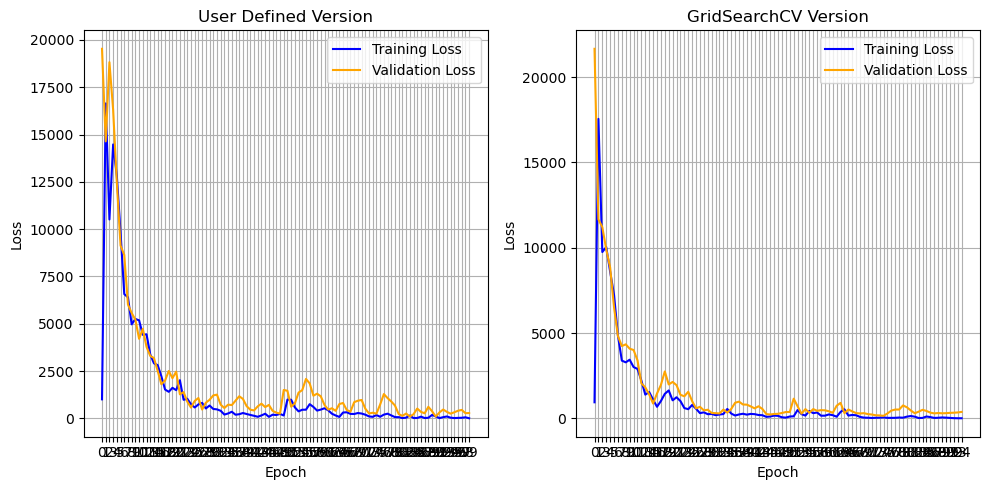

In [57]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

# Plot the training and validation loss of version 1 on the first subplot
ax1.plot(history1.history['loss'], label='Training Loss', color='blue')
ax1.plot(history1.history['val_loss'], label='Validation Loss', color='orange')
ax1.set_title("User Defined Version")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("Loss")
ax1.legend()
ax1.grid(True)

# Set the x-axis ticks by increments of 1 for the first subplot
ax1.set_xticks(np.arange(min(history1.epoch), max(history1.epoch)+1, 1))
ax1.set_xticklabels(np.arange(min(history1.epoch), max(history1.epoch)+1, 1))

# Plot the training and validation loss of version 2 on the second subplot
ax2.plot(history2.history['loss'], label='Training Loss', color='blue')
ax2.plot(history2.history['val_loss'], label='Validation Loss', color='orange')
ax2.set_title("GridSearchCV Version")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Loss")
ax2.legend()
ax2.grid(True)

# Set the x-axis ticks by increments of 1 for the second subplot
ax2.set_xticks(np.arange(min(history2.epoch), max(history2.epoch)+1, 1))
ax2.set_xticklabels(np.arange(min(history2.epoch), max(history2.epoch)+1, 1))

# Adjust the spacing between the subplots
plt.tight_layout()

# Show the figure
plt.show()


**Below follows the Confusion Matrix Implementation**

I ended up making a confusion matrix and then putting it into a heat map because I thought it would be easier to read.

In [58]:
#Turns out both y_test = int32 and y_pred2 = int64 are two diff datatypes. So converting them to the same one
#y_pred3 = y_pred2.astype (np.int32)


#Unfortunately at this point i realised that somehow in the train test split, column "3"s somehow got missed
#entirely from the testing split. As a consequence i was having issues with my confusion matrix. As it would say that 
#it expected 14,14 instead of (15,15). Since i have performed heavy computation and i can't afford to redo it all with
#a new training testing split. I will instead append some values from the y_train to the y_test to make it work.
labels = unique_labels(y_test)
print(labels)

#at this point i therefore also redid the test executions.
#note: i re-ran this after adding the test indices, so it'll no longer show the missing 3.

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]


<AxesSubplot:title={'center':'Confusion Matrix for GridSearchCV Model'}>

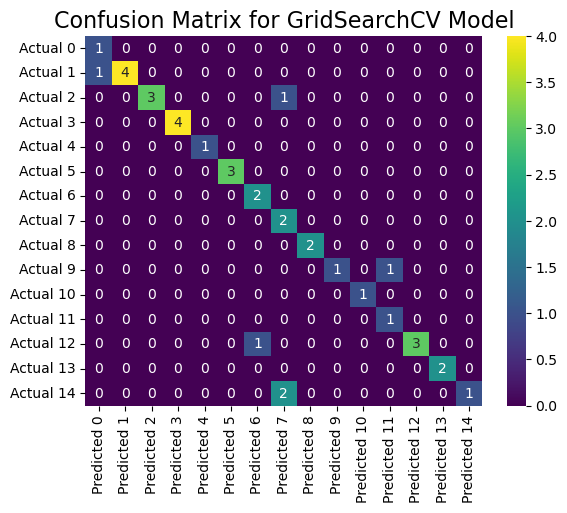

In [60]:
#Writing Function for Confusion Matrix
def plot_conf_mat(y_test,y_pred):
    labels = unique_labels(y_test)
    column = [f'Predicted {label}' for label in labels]
    indexx = [f'Actual {label}' for label in labels]
    table = pd.DataFrame(confusion_matrix(y_test,y_pred), columns=column, index=indexx)
    return sns.heatmap(table, annot=True, fmt='d', cmap='viridis')

plt.title('Confusion Matrix for GridSearchCV Model', fontsize=16, loc='center')
plot_conf_mat(y_test,y_pred2)


<AxesSubplot:title={'center':'Confusion Matrix for User-Defined Model'}>

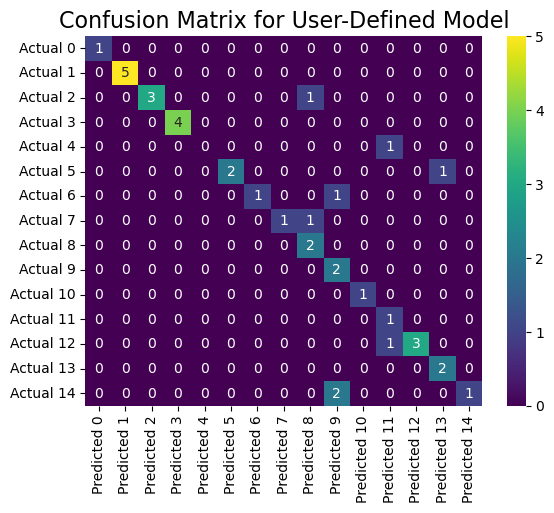

In [61]:
plt.title('Confusion Matrix for User-Defined Model', fontsize=16, loc='center')
plot_conf_mat(y_test,y_pred1)

**Below Follow The Tables**

In [81]:
#Tables for Metrics
# Create a table to compare the metrics of the two models
metrics_table = pd.DataFrame({
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1-score'],
    'Without Tuning ': [accuracy1, precision1, recall1, f1_1],
    'With Tuning ': [accuracy2, precision2, recall2, f1_2]
})

print("Metrics Table")
metrics_table

Metrics Table


,Metric,Without Tuning,With Tuning
0,Accuracy,0.783784,0.837838
1,Precision,0.793333,0.871111
2,Recall,0.766667,0.875556
3,F1-score,0.725714,0.831640


In [82]:
#Table for Experiment Overview including experiment name, hidden layers, neurons per layer, activation function, learning rate, momentum, epochs, batch size,
data = {
    "Experiment Name": ["Without Tuning", "With Tuning"],
    "Hidden Layers": [2, best_params['hidden_layers']],
    "Neurons per Layer": ["128", best_params['neurons_per_layer']],
    "Activation Function": ["ReLU", best_params['activation_function']],
    "Epochs": [100, best_params['epochs']],
    "Learning Rate": [0.01, best_params['learning_rate']],
    "Momentum": [0.09, best_params['momentum']],
    "Evaluation Metrics": ["Accuracy, Precision, Recall, F1-score"] * 2
}

df_experiment = pd.DataFrame(data)
print("Experiment Overview Table")
df_experiment

Experiment Overview Table


,Experiment Name,Hidden Layers,Neurons per Layer,Activation Function,Epochs,Learning Rate,Momentum,Evaluation Metrics
0,Without Tuning,2,128,ReLU,100,0.010,0.09,"Accuracy, Precision, Recall, F1-score"
1,With Tuning,2,128,relu,100,0.001,0.80,"Accuracy, Precision, Recall, F1-score"
